<a href="https://colab.research.google.com/github/albivaltzew/container_number_rec/blob/main/Container_Recognition_with_boxes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# New comet

In [ ]:
!pip install ultralytics torch torchvision comet_ml

In [2]:
!export COMET_API_KEY="TQluurAc0q21N1dKDjdrJfqzo"

# Start

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!unzip  /content/drive/MyDrive/Container_Dataset/train_images.zip -d /content/data
!unzip  /content/drive/MyDrive/Container_Dataset/images_label_yolo.zip -d /content/data
!unzip  /content/drive/MyDrive/Container_Dataset/test_images.zip -d /content/data

Streaming output truncated to the last 5000 lines.
  inflating: /content/data/images/1-133713001-OCR-AH-A01.jpg  
  inflating: /content/data/__MACOSX/images/._1-133713001-OCR-AH-A01.jpg  
  inflating: /content/data/images/1-152007001-OCR-AS-B01.jpg  
  inflating: /content/data/__MACOSX/images/._1-152007001-OCR-AS-B01.jpg  
  inflating: /content/data/images/1-131400001-OCR-LB-C02.jpg  
  inflating: /content/data/__MACOSX/images/._1-131400001-OCR-LB-C02.jpg  
  inflating: /content/data/images/1-153205001-OCR-AS-B01.jpg  
  inflating: /content/data/__MACOSX/images/._1-153205001-OCR-AS-B01.jpg  
  inflating: /content/data/images/1-155700001-OCR-AH-A01.jpg  
  inflating: /content/data/__MACOSX/images/._1-155700001-OCR-AH-A01.jpg  
  inflating: /content/data/images/1-154647001-OCR-RF-D01.jpg  
  inflating: /content/data/__MACOSX/images/._1-154647001-OCR-RF-D01.jpg  
  inflating: /content/data/images/1-130316001-OCR-AS-B01.jpg  
  inflating: /content/data/__MACOSX/images/._1-130316001-OCR-AS-

# YOLO

In [4]:
!pip install ultralytics


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


#Datasetpreprocessing


In [4]:
from sklearn.model_selection import train_test_split
import shutil
import os

In [5]:
images_path = "/content/data/images"
labels_path = "/content/data/images_label_yolo"


In [6]:
# Read images and annotations
images = [os.path.join(images_path, x) for x in os.listdir(images_path)]
labels = [os.path.join(labels_path, x) for x in os.listdir(labels_path)]

In [7]:
images.sort()
labels.sort()

# Split the dataset into train-valid-test splits
train_images, val_images, train_labels, val_labels = train_test_split(images, labels, test_size = 0.2, random_state = 1)
val_images, test_images, val_labels, test_labels = train_test_split(val_images, val_labels, test_size = 0.5, random_state = 1)

In [8]:
!mkdir /content/data/train /content/data/test /content/data/val

In [9]:

!mkdir /content/data/train/images /content/data/train/labels

!mkdir /content/data/test/images /content/data/test/labels

!mkdir /content/data/val/images /content/data/val/labels

In [10]:
#Utility function to move images
def move_files_to_folder(list_of_files, destination_folder):
    for f in list_of_files:
        try:
            shutil.move(f, destination_folder)
        except:
            print(f)
            assert False

In [11]:
train_folder = "/content/data/train"
test_folder = "/content/data/test"
val_folder = "/content/data/val"

In [12]:
# Move the splits into their folders
move_files_to_folder(train_images, train_folder+'/images')
move_files_to_folder(train_labels, train_folder+'/labels')

move_files_to_folder(val_images, val_folder+'/images')
move_files_to_folder(val_labels, val_folder+'/labels')

move_files_to_folder(test_images, test_folder+'/images')
move_files_to_folder(test_labels, test_folder+'/labels')

# YOlO

In [5]:
from ultralytics import YOLO

In [14]:


# Load a model
# model = YOLO('yolov8n.yaml')  # build a new model from YAML
# model = YOLO('/content/runs/detect/train/weights/last.pt')  # load a pretrained model (recommended for training)
# model = YOLO('yolov8n.yaml').load('yolov8n.pt')  # build from YAML and transfer weights
model = YOLO('/content/drive/MyDrive/Container_Dataset/best_1_96_epochs.pt')


In [ ]:
# Train the model
# model.train(data='/content/drive/MyDrive/LDT_yaml/data_9.yaml', epochs=2, imgsz=640)

results = model.train(
    data="/content/drive/MyDrive/Container_Dataset/data.yaml",
    project="container_number_recognition",
    batch=32,
    save_period=1,
    save_json=True,
    epochs=300,
    imgsz=640,
    patience=50,

)

Ultralytics YOLOv8.0.118 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/Container_Dataset/best_1_96_epochs.pt, data=/content/drive/MyDrive/Container_Dataset/data.yaml, epochs=300, patience=50, batch=32, imgsz=640, save=True, save_period=1, cache=False, device=None, workers=8, project=container_number_recognition, name=None, exist_ok=False, pretrained=False, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=True, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, re

In [ ]:
model = YOLO('/content/container_number_recognition/train/weights/best.pt')  # load a custom model

# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map    # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps   # a list contains map50-95 of each category

Ultralytics YOLOv8.0.118 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients
val: Scanning /content/data/val/labels.cache... 300 images, 0 backgrounds, 0 corrupt: 100%|██████████| 300/300 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/data/val/images/1-123113001-OCR-RF-D01.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/data/val/images/1-124137001-OCR-AH-A01.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/data/val/images/1-144733001-OCR-AS-B01.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/data/val/images/1-145715001-OCR-AH-A01.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/data/val/images/1-154501001-OCR-AS-B01.jpg: corrupt JPEG restored and saved
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:15<00:00,  1.21it/s]
                   all        300        555      0.987      0.993       0

array([    0.79157])

# Predict an Image


In [48]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

In [16]:
img = "/content/data/test_images/1-122700001-OCR-RF-D01.jpg"


image 1/1 /content/data/test_images/1-122700001-OCR-RF-D01.jpg: 384x640 2 Container Numbers, 57.1ms
Speed: 13.8ms preprocess, 57.1ms inference, 40.1ms postprocess per image at shape (1, 3, 640, 640)


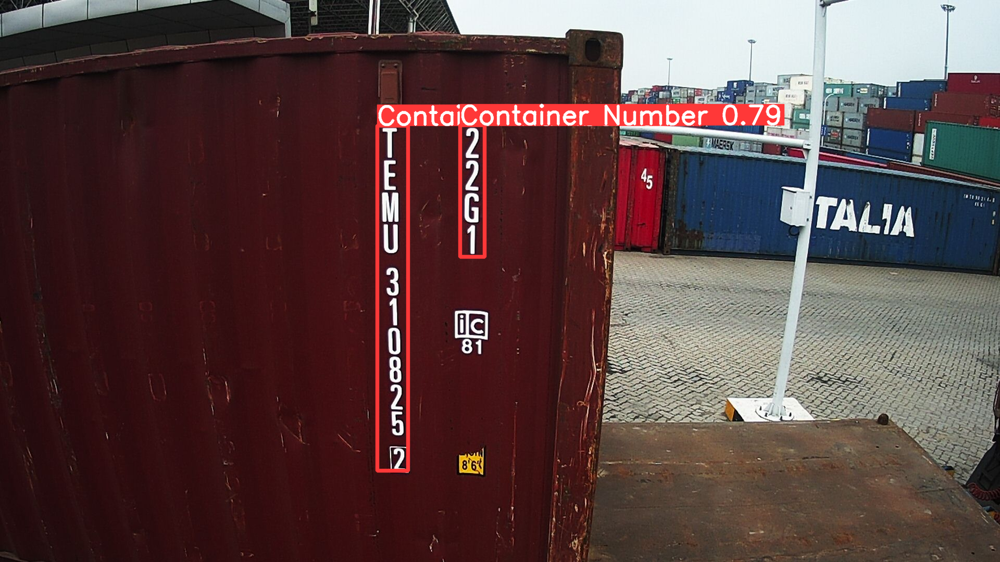

In [17]:
res = model(img)
res_plotted = res[0].plot()
cv2_imshow(res_plotted)


image 1/1 /content/data/test_images/1-124054001-OCR-LB-C02.jpg: 384x640 2 Container Numbers, 9.1ms
Speed: 2.7ms preprocess, 9.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


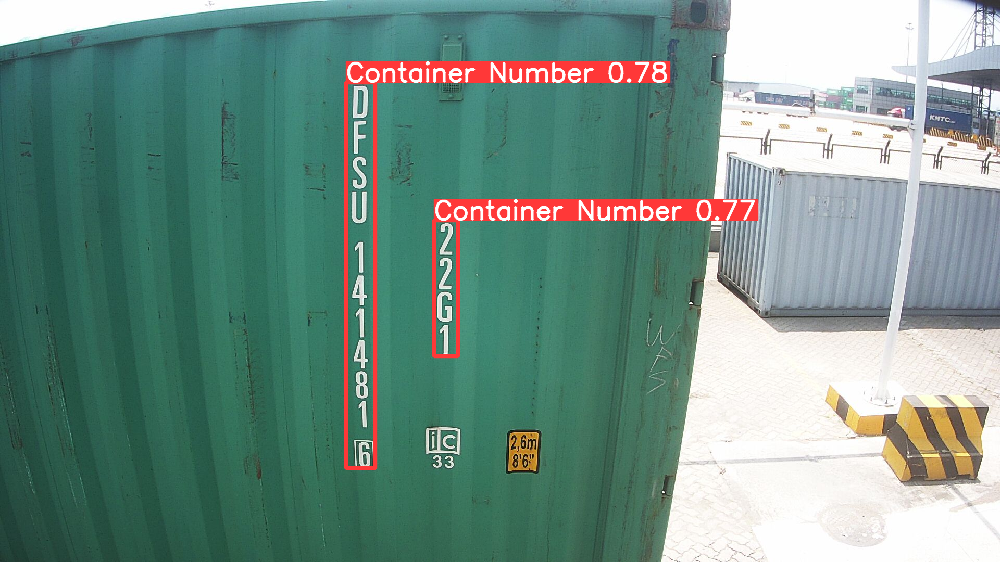

In [ ]:
res = model("/content/data/test_images/1-124054001-OCR-LB-C02.jpg")
res_plotted = res[0].plot()
cv2_imshow(res_plotted)


image 1/1 /content/data/test_images/1-125409001-OCR-LF-C01.jpg: 384x640 2 Container Numbers, 6.1ms
Speed: 2.6ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


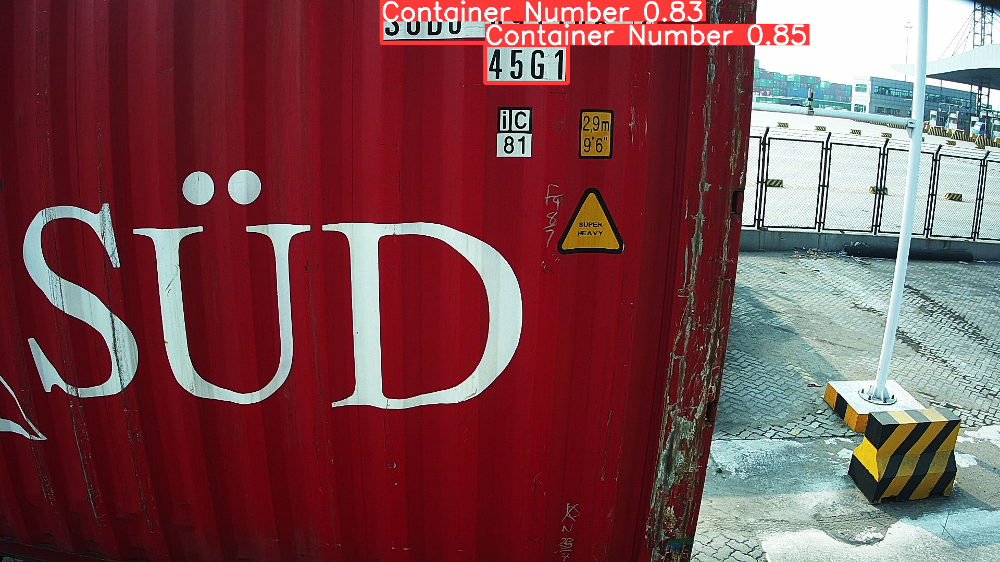

In [18]:
res = model("/content/data/test_images/1-125409001-OCR-LF-C01.jpg")
res_plotted = res[0].plot()
cv2_imshow(res_plotted)


image 1/1 /content/data/test_images/1-125409001-OCR-LF-C01.jpg: 384x640 2 Container Numbers, 5.9ms
Speed: 2.2ms preprocess, 5.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/data/test_images/1-123718001-OCR-AS-B01.jpg: 384x640 2 Container Numbers, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/data/test_images/1-130259001-OCR-AS-B01.jpg: 384x640 2 Container Numbers, 6.2ms
Speed: 2.4ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/data/test_images/1-142515001-OCR-AH-A01.jpg: 384x640 1 Container Number, 6.6ms
Speed: 2.6ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


(-0.5, 1919.5, 1079.5, -0.5)

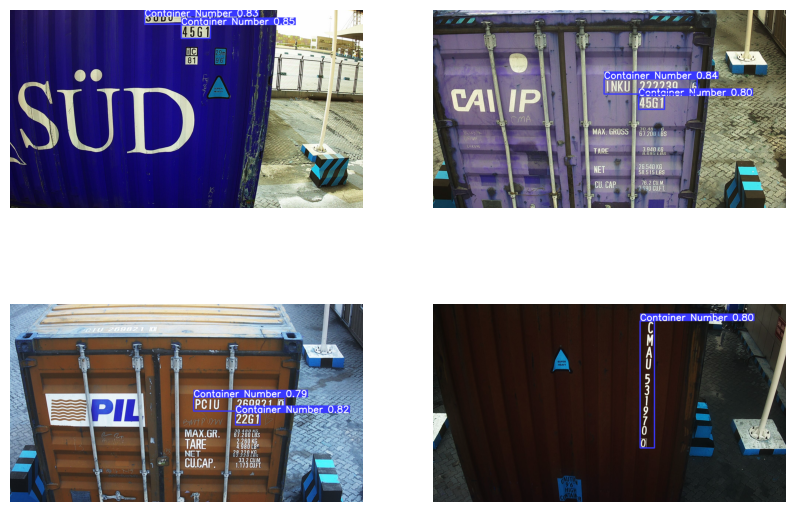

In [19]:
# code for displaying multiple images in one figure

#import libraries
import cv2
from matplotlib import pyplot as plt

# create figure
fig = plt.figure(figsize=(10, 7))

# setting values to rows and column variables
rows = 2
columns = 2

# reading images
# Image1 = cv2.imread('/content/data/test_images/1-122923001-OCR-RF-D01.jpg')
# Image2 = cv2.imread('/content/data/test_images/1-123718001-OCR-AS-B01.jpg')
# Image3 = cv2.imread('/content/data/test_images/1-130259001-OCR-AS-B01.jpg')
# Image4 = cv2.imread('/content/data/test_images/1-142633001-OCR-LF-C01.jpg')

res = model("/content/data/test_images/1-125409001-OCR-LF-C01.jpg")
res_plotted1 = res[0].plot()

res = model('/content/data/test_images/1-123718001-OCR-AS-B01.jpg')
res_plotted2 = res[0].plot()

res = model('/content/data/test_images/1-130259001-OCR-AS-B01.jpg')
res_plotted3 = res[0].plot()

res = model('/content/data/test_images/1-142515001-OCR-AH-A01.jpg')
res_plotted4 = res[0].plot()

# Adds a subplot at the 1st position
fig.add_subplot(rows, columns, 1)

# showing image
plt.imshow(res_plotted1)
plt.axis('off')
# plt.title("First")

# Adds a subplot at the 2nd position
fig.add_subplot(rows, columns, 2)

# showing image
plt.imshow(res_plotted2)
plt.axis('off')
# plt.title("Second")

# Adds a subplot at the 3rd position
fig.add_subplot(rows, columns, 3)

# showing image
plt.imshow(res_plotted3)
plt.axis('off')
# plt.title("Third")

# Adds a subplot at the 4th position
fig.add_subplot(rows, columns, 4)

# showing image
plt.imshow(res_plotted4)
plt.axis('off')
# plt.title("Fourth")


In [ ]:
# Evaluate the model's performance on the validation set
results = model.val()

Ultralytics YOLOv8.0.118 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
val: Scanning /content/data/val/labels.cache... 300 images, 0 backgrounds, 0 corrupt: 100%|██████████| 300/300 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/data/val/images/1-123113001-OCR-RF-D01.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/data/val/images/1-124137001-OCR-AH-A01.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/data/val/images/1-144733001-OCR-AS-B01.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/data/val/images/1-145715001-OCR-AH-A01.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/data/val/images/1-154501001-OCR-AS-B01.jpg: corrupt JPEG restored and saved
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:15<00:00,  1.21it/s]
                   all        300        555      0.987      0.993       0.99      0.792
Speed: 0.9ms preprocess, 3.3ms inference, 0.0ms loss

In [22]:
img = '/content/data/test_images/1-130259001-OCR-AS-B01.jpg'
results = model(img)
boxes = results[0].boxes
box = boxes[0]  # returns one box
box.xyxy



image 1/1 /content/data/test_images/1-130259001-OCR-AS-B01.jpg: 384x640 2 Container Numbers, 8.9ms
Speed: 3.5ms preprocess, 8.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


tensor([[1226.5620,  596.4099, 1359.7578,  661.9616]], device='cuda:0')

In [60]:
img = cv2.imread('/content/data/test_images/1-130259001-OCR-AS-B01.jpg')
results = model(img)
boxes = results[0].boxes
box = boxes[0]  # returns one box
box.xyxy


0: 384x640 1 J, 2 Ts, 17.7ms
Speed: 2.6ms preprocess, 17.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


tensor([[   0.0000,    0.0000, 1674.6888, 1080.0000]], device='cuda:0')

In [31]:
box.xyxy[0]
np_box = box.xyxy[0].detach().cpu().numpy()
np_box

array([     1226.6,      596.41,      1359.8,      661.96], dtype=float32)

In [44]:
img[int(np_box[0]):int(np_box[2])]

array([], shape=(0, 1920, 3), dtype=uint8)

In [ ]:
plate = img[int(np_box[1]):int(np_box[3]), int(np_box[0]):int(np_box[2])]
plate

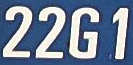

In [51]:
# plate = img[int(np_box[0]):int(np_box[2]), int(np_box[1]):int(np_box[3])]
cv2_imshow(plate)

# Box properties

In [ ]:
# boxes.xyxy  # box with xyxy format, (N, 4)
# boxes.xywh  # box with xywh format, (N, 4)
# boxes.xyxyn  # box with xyxy format but normalized, (N, 4)
# boxes.xywhn  # box with xywh format but normalized, (N, 4)
# boxes.conf  # confidence score, (N, )
# boxes.cls  # cls, (N, )
# boxes.data  # raw bboxes tensor, (N, 6) or boxes.boxes

# Code for video prediction


In [ ]:
import cv2
from ultralytics import YOLO

# Load the YOLOv8 model
model = YOLO('yolov8n.pt')

# Open the video file
video_path = "path/to/your/video/file.mp4"
cap = cv2.VideoCapture(video_path)

# Loop through the video frames
while cap.isOpened():
    # Read a frame from the video
    success, frame = cap.read()

    if success:
        # Run YOLOv8 inference on the frame
        results = model(frame)

        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        # Display the annotated frame
        cv2.imshow("YOLOv8 Inference", annotated_frame)

        # Break the loop if 'q' is pressed
        if cv2.waitKey(1) & 0xFF == ord("q"):
            break
    else:
        # Break the loop if the end of the video is reached
        break

# Release the video capture object and close the display window
cap.release()
cv2.destroyAllWindows()


# Save model


In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
!zip -r /content/train_95_epochs.zip /content/runs/detect

  adding: content/runs/detect/ (stored 0%)
  adding: content/runs/detect/val/ (stored 0%)
  adding: content/runs/detect/val/val_batch1_labels.jpg (deflated 6%)
  adding: content/runs/detect/val/val_batch0_labels.jpg (deflated 6%)
  adding: content/runs/detect/val/F1_curve.png (deflated 19%)
  adding: content/runs/detect/val/val_batch0_pred.jpg (deflated 6%)
  adding: content/runs/detect/val/R_curve.png (deflated 19%)
  adding: content/runs/detect/val/val_batch1_pred.jpg (deflated 6%)
  adding: content/runs/detect/val/P_curve.png (deflated 26%)
  adding: content/runs/detect/val/confusion_matrix.png (deflated 36%)
  adding: content/runs/detect/val/PR_curve.png (deflated 29%)
  adding: content/runs/detect/val/confusion_matrix_normalized.png (deflated 34%)
  adding: content/runs/detect/val/val_batch2_pred.jpg (deflated 6%)
  adding: content/runs/detect/val/val_batch2_labels.jpg (deflated 6%)


In [ ]:
!zip -r /content/train_95_epochs.zip /content/container_number_recognition/train

  adding: content/container_number_recognition/train/ (stored 0%)
  adding: content/container_number_recognition/train/train_batch0.jpg (deflated 4%)
  adding: content/container_number_recognition/train/train_batch2.jpg (deflated 4%)
  adding: content/container_number_recognition/train/val_batch1_labels.jpg (deflated 7%)
  adding: content/container_number_recognition/train/val_batch0_labels.jpg (deflated 6%)
  adding: content/container_number_recognition/train/weights/ (stored 0%)
  adding: content/container_number_recognition/train/weights/epoch23.pt (deflated 8%)
  adding: content/container_number_recognition/train/weights/epoch1.pt (deflated 8%)
  adding: content/container_number_recognition/train/weights/epoch43.pt (deflated 8%)
  adding: content/container_number_recognition/train/weights/epoch50.pt (deflated 8%)
  adding: content/container_number_recognition/train/weights/epoch26.pt (deflated 8%)
  adding: content/container_number_recognition/train/weights/epoch9.pt (deflated 8%)


In [ ]:

# results = model.train(data='/content/drive/MyDrive/Container_Dataset/data.yaml',
#                       epochs=100,
#                       imgsz=640,
#                       patience=50,
#                       save_period=1,
#                       batch = 32,
#                       save_json = True)
# experiment.end()

## AlphaNumeric training


# Dataset preprocessing

In [ ]:
!unzip  /content/drive/MyDrive/Container_Dataset/alphanumeric_ds.zip -d /content/data

In [10]:
from sklearn.model_selection import train_test_split
import shutil
import os

In [11]:
images_path = "/content/data/alphanumeric_ds/images"
labels_path = "/content/data/alphanumeric_ds/labels"

In [12]:
# Read images and annotations
images = [os.path.join(images_path, x) for x in os.listdir(images_path)]
labels = [os.path.join(labels_path, x) for x in os.listdir(labels_path)]

In [13]:
images.sort()
labels.sort()

# Split the dataset into train-valid-test splits
train_images, val_images, train_labels, val_labels = train_test_split(images, labels, test_size = 0.2, random_state = 1)
val_images, test_images, val_labels, test_labels = train_test_split(val_images, val_labels, test_size = 0.5, random_state = 1)

In [14]:
!mkdir /content/data/train /content/data/test /content/data/val

In [15]:
!mkdir /content/data/train/images /content/data/train/labels

!mkdir /content/data/test/images /content/data/test/labels

!mkdir /content/data/val/images /content/data/val/labels

In [16]:
#Utility function to move images
def move_files_to_folder(list_of_files, destination_folder):
    for f in list_of_files:
        try:
            shutil.move(f, destination_folder)
        except:
            print(f)
            assert False

In [17]:
train_folder = "/content/data/train"
test_folder = "/content/data/test"
val_folder = "/content/data/val"

In [18]:
# Move the splits into their folders
move_files_to_folder(train_images, train_folder+'/images')
move_files_to_folder(train_labels, train_folder+'/labels')

move_files_to_folder(val_images, val_folder+'/images')
move_files_to_folder(val_labels, val_folder+'/labels')

move_files_to_folder(test_images, test_folder+'/images')
move_files_to_folder(test_labels, test_folder+'/labels')

# Тренировка

In [19]:
from ultralytics import YOLO

In [20]:
model = YOLO('best_100.pt')

In [ ]:
results = model.train(
    data="/content/drive/MyDrive/Container_Dataset/alphanumeric.yaml",
    project="alphanumeric",
    batch=32,
    save_period=1,
    save_json=True,
    epochs=100,
    imgsz=640,
    patience=50,
)

Ultralytics YOLOv8.0.119 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=best_100.pt, data=/content/drive/MyDrive/Container_Dataset/alphanumeric.yaml, epochs=100, patience=50, batch=32, imgsz=640, save=True, save_period=1, cache=False, device=None, workers=8, project=alphanumeric, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=True, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=Fa

# Inference

In [1]:
import cv2
from google.colab.patches import cv2_imshow

In [53]:
model = YOLO('/content/best_100.pt')

In [11]:
img = "/content/data/test_images/1-125409001-OCR-LF-C01.jpg"


0: 320x640 2 Gs, 149.1ms
Speed: 2.1ms preprocess, 149.1ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)


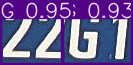

In [54]:
res = model(plate)
res_plotted = res[0].plot()
cv2_imshow(res_plotted)

In [59]:
res[0]

ultralytics.yolo.engine.results.Results object with attributes:

boxes: ultralytics.yolo.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: '0', 1: '1', 2: '2', 3: '3', 4: '4', 5: '5', 6: '6', 7: '7', 8: '8', 9: '9', 10: 'A', 11: 'B', 12: 'C', 13: 'D', 14: 'E', 15: 'F', 16: 'G', 17: 'H', 18: 'I', 19: 'J', 20: 'K', 21: 'L', 22: 'M', 23: 'N', 24: 'O', 25: 'P', 26: 'Q', 27: 'R', 28: 'S', 29: 'T', 30: 'U', 31: 'V', 32: 'W', 33: 'X', 34: 'Y', 35: 'Z'}
orig_img: array([[[116,  74,  45],
        [118,  76,  47],
        [118,  76,  47],
        ...,
        [123,  76,  44],
        [123,  76,  44],
        [125,  78,  46]],

       [[118,  76,  47],
        [121,  79,  50],
        [121,  79,  50],
        ...,
        [120,  73,  41],
        [120,  75,  41],
        [122,  77,  43]],

       [[116,  74,  45],
        [118,  76,  47],
        [119,  77,  48],
        ...,
        [118,  71,  39],
        [117,  72,  38],
        [120,  75,  41]],

       ...,


# Маша

In [ ]:
from ultralytics import YOLO


# Load a model
# model = YOLO('yolov8n.yaml')  # build a new model from YAML
model = YOLO('/content/best.pt')  # load a pretrained model (recommended for training)
# model = YOLO('yolov8n.yaml').load('yolov8n.pt')  # build from YAML and transfer weights



In [ ]:
# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map    # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps   # a list contains map50-95 of each category

Ultralytics YOLOv8.0.114 🚀 Python-3.10.11 torch-2.0.1+cu118 CPU
100%|██████████| 755k/755k [00:00<00:00, 78.4MB/s]
val: Scanning /content/data/labeled_data/val/labels... 297 images, 0 backgrounds, 3 corrupt: 100%|██████████| 300/300 [00:15<00:00, 19.07it/s]
val: WARNING ⚠️ /content/data/labeled_data/val/images/20220804_180256_1.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/data/labeled_data/val/images/20220804_180302_1.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/data/labeled_data/val/images/20220804_180305_1.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/data/labeled_data/val/images/20220804_180308_1.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/data/labeled_data/val/images/20220804_180310_1.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/data/labeled_data/val/images/20220804_180321_1.jpg: ignoring corrupt image/label: cannot identify image file '/content/data/labeled_data/val/images/20220804_180321_1.jpg'
v

array([      0.963,     0.90501,     0.99383])

# VGG

In [ ]:
import os
import cv2
from torchvision.utils import make_grid
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from PIL import Image
from __future__ import print_function, division
from torch.utils.data import random_split
import torch
import pandas as pd
import torchvision
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils, datasets, models
from google.colab.patches import cv2_imshow
from torch.autograd import Variable
from skimage.color import rgb2gray

import time
import copy

In [ ]:
preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
dataset = torchvision.datasets.ImageFolder(root='/content/data_new/data',
                                           transform = preprocess)


images.shape: torch.Size([20, 3, 224, 224])


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

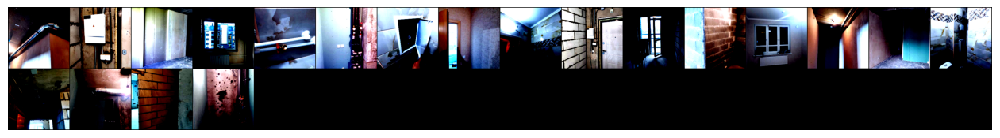

In [ ]:


# prep the train, validation and test dataset
BATCH_SIZE = 20
torch.manual_seed(2021)
val_size = 20
test_size = 20
train_size = len(dataset) - val_size - test_size
train, val, test = random_split(dataset, [train_size, val_size, test_size])

#  train, val and test datasets to the dataloader
train_loader = DataLoader(train, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test, batch_size=BATCH_SIZE, shuffle=False)

TRAIN = 'train'
VAL = 'val'
TEST = 'test'
dataset_sizes = {TEST: test_size, TRAIN: train_size, VAL: val_size}
dataloaders = {TEST: test_loader, TRAIN: train_loader, VAL: val_loader}

for images, _ in train_loader:
    print('images.shape:', images.shape)
    plt.figure(figsize=(16, 8))
    plt.axis('off')
    plt.imshow(make_grid(images, nrow=16).permute((1, 2, 0)))
    break

num_classes = 2

# Load the pretrained model from pytorch
# vgg16 = models.vgg16_bn()
# vgg16.load_state_dict(torch.load("../input/vgg16bn/vgg16_bn.pth"))
vgg16 = torch.hub.load('pytorch/vision:v0.10.0', 'vgg16_bn', pretrained=True)
# print(vgg16.classifier[6].out_features) # 1000


# Freeze training for all layers
for param in vgg16.features.parameters():
    param.require_grad = False

# Newly created modules have require_grad=True by default
num_features = vgg16.classifier[6].in_features
features = list(vgg16.classifier.children())[:-1]  # Remove last layer
features.extend([nn.Linear(num_features, num_classes)])  # Add our layer with 4 outputs
vgg16.classifier = nn.Sequential(*features)  # Replace the model classifier
print(vgg16)


Test before training
Evaluating model
----------
Test batch 0/1

<ipython-input-24-7e4b403d4feb>:34: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  inputs, labels = Variable(inputs, volatile=True), Variable(labels, volatile=True)



Evaluation completed in 0m 14s
Avg loss (test): 0.0394
Avg acc (test): 0.3000
----------


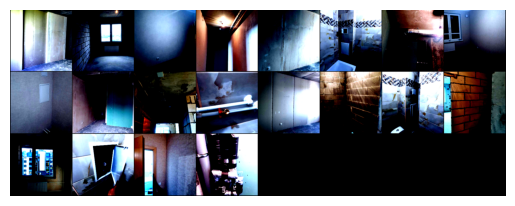

<ipython-input-24-7e4b403d4feb>:98: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  inputs, labels = Variable(inputs, volatile=True), Variable(labels, volatile=True)


Ground truth:


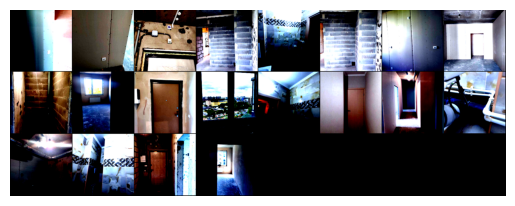

Prediction:


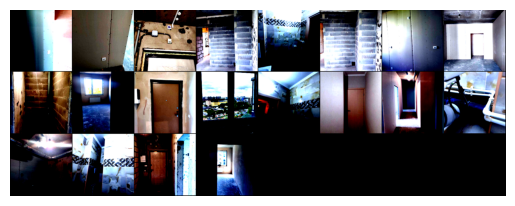

Epoch 0/100
----------
Training batch 0/1.5
Validation batch 0/1

<ipython-input-24-7e4b403d4feb>:195: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  inputs, labels = Variable(inputs, volatile=True), Variable(labels, volatile=True)



Epoch 0 result: 
Avg loss (train): 0.0534
Avg acc (train): 0.6786
Avg loss (val): 0.0364
Avg acc (val): 0.3000
----------

Epoch 1/100
----------
Training batch 0/1.5
Validation batch 0/1
Epoch 1 result: 
Avg loss (train): 0.0488
Avg acc (train): 0.7857
Avg loss (val): 0.0304
Avg acc (val): 0.7500
----------

Epoch 2/100
----------
Training batch 0/1.5

KeyboardInterrupt: ignored

In [ ]:

use_gpu = torch.cuda.is_available()
if use_gpu:
    print("Using CUDA")
if use_gpu:
    vgg16.cuda()  # .cuda() will move everything to the GPU side

criterion = nn.CrossEntropyLoss()
optimizer_ft = optim.SGD(vgg16.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)


def eval_model(vgg, criterion):
    since = time.time()
    avg_loss = 0
    avg_acc = 0
    loss_test = 0
    acc_test = 0

    test_batches = len(dataloaders[TEST])
    print("Evaluating model")
    print('-' * 10)

    for i, data in enumerate(dataloaders[TEST]):
        if i % 100 == 0:
            print("\rTest batch {}/{}".format(i, test_batches), end='', flush=True)

        vgg.train(False)
        vgg.eval()
        inputs, labels = data

        if use_gpu:
            inputs, labels = Variable(inputs.cuda(), volatile=True), Variable(labels.cuda(), volatile=True)
        else:
            inputs, labels = Variable(inputs, volatile=True), Variable(labels, volatile=True)

        outputs = vgg(inputs)

        _, preds = torch.max(outputs.data, 1)
        loss = criterion(outputs, labels)

        loss_test += loss  # loss.data[0]
        acc_test += torch.sum(preds == labels.data)

        del inputs, labels, outputs, preds
        torch.cuda.empty_cache()

    avg_loss = loss_test / dataset_sizes[TEST]
    avg_acc = acc_test / dataset_sizes[TEST]

    elapsed_time = time.time() - since
    print()
    print("Evaluation completed in {:.0f}m {:.0f}s".format(elapsed_time // 60, elapsed_time % 60))
    print("Avg loss (test): {:.4f}".format(avg_loss))
    print("Avg acc (test): {:.4f}".format(avg_acc))
    print('-' * 10)


print("Test before training")
eval_model(vgg16, criterion)


def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    # plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)


def show_databatch(inputs, classes):
    out = torchvision.utils.make_grid(inputs)
    imshow(out)


# Get a batch of training data
inputs, classes = next(iter(dataloaders[TRAIN]))
show_databatch(inputs, classes)


def visualize_model(vgg, num_images=6):
    was_training = vgg.training

    # Set model for evaluation
    vgg.train(False)
    vgg.eval()

    images_so_far = 0

    for i, data in enumerate(dataloaders[TEST]):
        inputs, labels = data
        size = inputs.size()[0]

        if use_gpu:
            inputs, labels = Variable(inputs.cuda(), volatile=True), Variable(labels.cuda(), volatile=True)
        else:
            inputs, labels = Variable(inputs, volatile=True), Variable(labels, volatile=True)

        outputs = vgg(inputs)

        _, preds = torch.max(outputs.data, 1)
        predicted_labels = [preds[j] for j in range(inputs.size()[0])]

        print("Ground truth:")
        show_databatch(inputs.data.cpu(), labels.data.cpu())
        print("Prediction:")
        show_databatch(inputs.data.cpu(), predicted_labels)

        del inputs, labels, outputs, preds, predicted_labels
        torch.cuda.empty_cache()

        images_so_far += size
        if images_so_far >= num_images:
            break

    vgg.train(mode=was_training)  # Revert model back to original training state


visualize_model(vgg16)  # test before training


def train_model(vgg, criterion, optimizer, scheduler, num_epochs=10):
    since = time.time()
    best_model_wts = copy.deepcopy(vgg.state_dict())
    best_acc = 0.0

    avg_loss = 0
    avg_acc = 0
    avg_loss_val = 0
    avg_acc_val = 0

    train_batches = len(dataloaders[TRAIN])
    val_batches = len(dataloaders[VAL])

    for epoch in range(num_epochs):
        print("Epoch {}/{}".format(epoch, num_epochs))
        print('-' * 10)

        loss_train = 0
        loss_val = 0
        acc_train = 0
        acc_val = 0

        vgg.train(True)

        for i, data in enumerate(dataloaders[TRAIN]):
            if i % 100 == 0:
                print("\rTraining batch {}/{}".format(i, train_batches / 2), end='', flush=True)

            # Use half training dataset
            if i >= train_batches / 2:
                break

            inputs, labels = data

            if use_gpu:
                inputs, labels = Variable(inputs.cuda()), Variable(labels.cuda())
            else:
                inputs, labels = Variable(inputs), Variable(labels)

            optimizer.zero_grad()

            outputs = vgg(inputs)

            _, preds = torch.max(outputs.data, 1)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            loss_train += loss
            acc_train += torch.sum(preds == labels.data)

            del inputs, labels, outputs, preds
            torch.cuda.empty_cache()

        print()
        # * 2 as we only used half of the dataset
        avg_loss = loss_train * 2 / dataset_sizes[TRAIN]
        avg_acc = acc_train * 2 / dataset_sizes[TRAIN]

        vgg.train(False)
        vgg.eval()

        for i, data in enumerate(dataloaders[VAL]):
            if i % 100 == 0:
                print("\rValidation batch {}/{}".format(i, val_batches), end='', flush=True)

            inputs, labels = data

            if use_gpu:
                inputs, labels = Variable(inputs.cuda(), volatile=True), Variable(labels.cuda(), volatile=True)
            else:
                inputs, labels = Variable(inputs, volatile=True), Variable(labels, volatile=True)

            optimizer.zero_grad()

            outputs = vgg(inputs)

            _, preds = torch.max(outputs.data, 1)
            loss = criterion(outputs, labels)

            loss_val += loss
            acc_val += torch.sum(preds == labels.data)

            del inputs, labels, outputs, preds
            torch.cuda.empty_cache()

        avg_loss_val = loss_val / dataset_sizes[VAL]
        avg_acc_val = acc_val / dataset_sizes[VAL]

        print()
        print("Epoch {} result: ".format(epoch))
        print("Avg loss (train): {:.4f}".format(avg_loss))
        print("Avg acc (train): {:.4f}".format(avg_acc))
        print("Avg loss (val): {:.4f}".format(avg_loss_val))
        print("Avg acc (val): {:.4f}".format(avg_acc_val))
        print('-' * 10)
        print()

        if avg_acc_val > best_acc:
            best_acc = avg_acc_val
            best_model_wts = copy.deepcopy(vgg.state_dict())

    elapsed_time = time.time() - since
    print()
    print("Training completed in {:.0f}m {:.0f}s".format(elapsed_time // 60, elapsed_time % 60))
    print("Best acc: {:.4f}".format(best_acc))

    vgg.load_state_dict(best_model_wts)
    return vgg


vgg16 = train_model(vgg16, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=100)
# torch.save(vgg16.state_dict(), '/content/drive/MyDrive/НИР/VGG16_200_images_dataset.pt')

eval_model(vgg16, criterion)



In [ ]:
!unzip

# MobileNet

In [ ]:
import torchvision.models

In [ ]:
from torchvision.models import list_models, get_model, get_weight, get_model_weights

In [ ]:
# List available models
all_models = torchvision.models.list_models()
classification_models = list_models(module=torchvision.models)

# Initialize models
# m1 = get_model("mobilenet_v3_small", weights=None)
m2 =torchvision.models.mobilenet_v3_small(weights='DEFAULT')


Downloading: "https://download.pytorch.org/models/mobilenet_v3_small-047dcff4.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_small-047dcff4.pth
100%|██████████| 9.83M/9.83M [00:00<00:00, 57.5MB/s]


In [ ]:
m2.classifier

Sequential(
  (0): Linear(in_features=576, out_features=1024, bias=True)
  (1): Hardswish()
  (2): Dropout(p=0.2, inplace=True)
  (3): Linear(in_features=1024, out_features=1000, bias=True)
)

In [ ]:
import torch.nn as nn

In [ ]:
classifier = nn.Sequential(
          nn. Linear(in_features=576, out_features=1024, bias=True),
          nn.Hardswish(),
          nn.Dropout(p=0.2, inplace=True),
          nn.Linear(in_features=1024, out_features=2, bias=True)
        )

In [ ]:
m2.classifier = classifier

In [ ]:
!unzip /content/data2.zip

Archive:  /content/data2.zip
   creating: data/
  inflating: __MACOSX/._data         
  inflating: data/.DS_Store          
  inflating: __MACOSX/data/._.DS_Store  
   creating: data/images/
   creating: data/без отделки/
  inflating: __MACOSX/data/._без отделки  
   creating: data/labels/
   creating: data/с отделкой/
  inflating: __MACOSX/data/._с отделкой  
  inflating: data/labeler.py         
  inflating: data/images/9007e27e-afad-4962-8f8d-23c188298f4e.jpg  
  inflating: __MACOSX/data/images/._9007e27e-afad-4962-8f8d-23c188298f4e.jpg  
  inflating: data/images/b624ae73-a7c9-4d18-840d-9d4289bddd08.jpg  
  inflating: __MACOSX/data/images/._b624ae73-a7c9-4d18-840d-9d4289bddd08.jpg  
  inflating: data/images/photo_2022-12-01_17-56-55 (2).jpg  
  inflating: __MACOSX/data/images/._photo_2022-12-01_17-56-55 (2).jpg  
  inflating: data/images/5837ade4-d644-4a3a-b33b-82969be52f52.jpg  
  inflating: __MACOSX/data/images/._5837ade4-d644-4a3a-b33b-82969be52f52.jpg  
  inflating: data/images/

In [ ]:
!unzip data.zip

Archive:  data.zip
   creating: data/
  inflating: data/.DS_Store          
replace __MACOSX/data/._.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
   creating: data/без отделки/
replace __MACOSX/data/._без отделки? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
   creating: data/с отделкой/
replace __MACOSX/data/._с отделкой? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
  inflating: data/без отделки/9007e27e-afad-4962-8f8d-23c188298f4e.jpg  
replace __MACOSX/data/без отделки/._9007e27e-afad-4962-8f8d-23c188298f4e.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
  inflating: data/без отделки/b624ae73-a7c9-4d18-840d-9d4289bddd08.jpg  
replace __MACOSX/data/без отделки/._b624ae73-a7c9-4d18-840d-9d4289bddd08.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: __MACOSX/data/без отделки/._b624ae73-a7c9-4d18-840d-9d4289bddd08.jpg  
  inflating: data/без отделки/5837ade4-d644-4a3a-b33b-82969be52f52.jpg  
  inflating: __MACOSX/data/без отделки/._5837ade4-d644-4a3a-b33b-82969be52f52.jpg  
  inflating:

In [ ]:
from PIL import Image

In [ ]:
img = Image.open('/content/data/images/02c93643-9c1a-4d46-84ad-18ac2b3caf42.jpg')

In [ ]:
import torch
import torchvision
import numpy as np

In [ ]:
data = torchvision.datasets.ImageFolder(root = '/content/data',
                                        transform =  torchvision.transforms.Compose([np.array, torch.Tensor]))#,
                                        # transform = torchvision.models.MobileNet_V3_Small_Weights.IMAGENET1K_V1.transforms)

In [ ]:
dataloader = torch.utils.data.DataLoader(data, batch_size=1)

In [ ]:
for i, (image, labels) in (enumerate(dataloader)):

        # forward pass
        outputs = m2(torch.transpose(image, 1,3))

KeyboardInterrupt: ignored